In [ ]:
import tensorflow as tf
from tensorflow import keras
import numpy as np
from keras import layers,models,losses,optimizers
from keras import backend
from tensorflow.keras.layers import Layer
from tensorflow.keras.utils import get_custom_objects
from tensorflow.nn import depth_to_space
import os
from PIL import Image
import matplotlib.pyplot as plt
from keras.constraints import max_norm

In [ ]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [ ]:
x_train = np.load('/content/drive/MyDrive/dataset_140000_512_into_60000_64.npy')

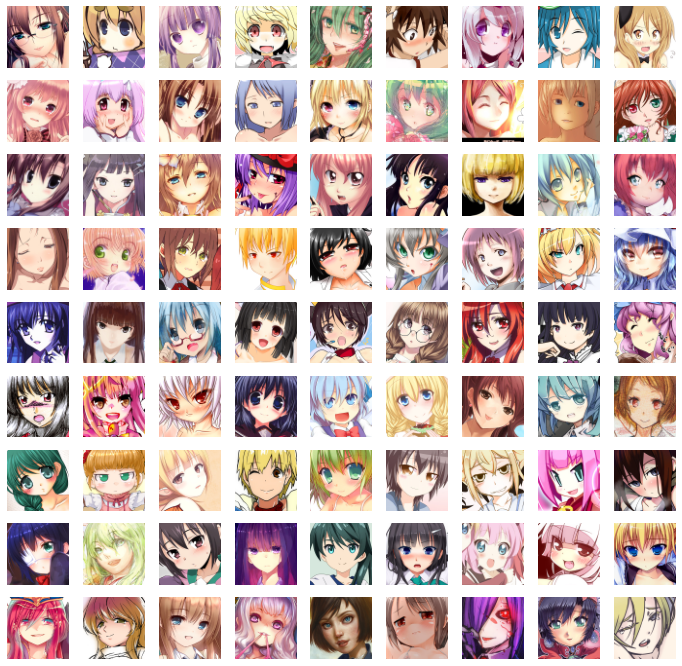

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize=(12,12))
for i in range(81):
  plt.subplot(9,9,i+1)
  plt.imshow(x_train[i]*0.5+0.5)
  plt.axis('off')
plt.show()

In [ ]:
def resnet_block(input,kernel_size,filters,strides):
    const = max_norm(1.0)
    init = keras.initializers.RandomNormal(mean=0.0,stddev=0.02)
    x = layers.Conv2D(filters,kernel_size,strides=strides,padding='same',kernel_initializer=init,kernel_constraint=const)(input)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)

    x = layers.Conv2D(filters,kernel_size,strides=strides,padding='same',kernel_initializer=init,kernel_constraint=const)(x)
    x = layers.BatchNormalization()(x)

    end = layers.Add()([input,x])
    return end

In [ ]:
def resnet_block2(input,kernel_size,filters,strides):
    const = max_norm(1.0)
    init = keras.initializers.RandomNormal(mean=0.0,stddev=0.02)
    x = layers.Conv2D(filters,kernel_size,strides=strides,padding='same',kernel_initializer=init,kernel_constraint=const)(input)
    x = layers.LeakyReLU(alpha=0.2)(x)

    x = layers.Conv2D(filters,kernel_size,strides=strides,padding='same',kernel_initializer=init,kernel_constraint=const)(x)
    
    x = layers.Add()([input,x])
    end = layers.LeakyReLU(alpha=0.2)(x)
    return end

In [ ]:
class SubpixelConv2D(Layer):
    """ Subpixel Conv2D Layer
    upsampling a layer from (h, w, c) to (h*r, w*r, c/(r*r)),
    where r is the scaling factor, default to 4
    # Arguments
    upsampling_factor: the scaling factor
    # Input shape
        Arbitrary. Use the keyword argument `input_shape`
        (tuple of integers, does not include the samples axis)
        when using this layer as the first layer in a model.
    # Output shape
        the second and the third dimension increased by a factor of
        `upsampling_factor`; the last layer decreased by a factor of
        `upsampling_factor^2`.
    # References
        Real-Time Single Image and Video Super-Resolution Using an Efficient
        Sub-Pixel Convolutional Neural Network Shi et Al. https://arxiv.org/abs/1609.05158
    """

    def __init__(self, upsampling_factor=4, **kwargs):
        super(SubpixelConv2D, self).__init__(**kwargs)
        self.upsampling_factor = upsampling_factor

    def build(self, input_shape):
        last_dim = input_shape[-1]
        factor = self.upsampling_factor * self.upsampling_factor
        if last_dim % (factor) != 0:
            raise ValueError('Channel ' + str(last_dim) + ' should be of '
                             'integer times of upsampling_factor^2: ' +
                             str(factor) + '.')

    def call(self, inputs, **kwargs):
        return depth_to_space( inputs, self.upsampling_factor )

    def get_config(self):
        config = { 'upsampling_factor': self.upsampling_factor, }
        base_config = super(SubpixelConv2D, self).get_config()
        return dict(list(base_config.items()) + list(config.items()))

    def compute_output_shape(self, input_shape):
        factor = self.upsampling_factor * self.upsampling_factor
        input_shape_1 = None
        if input_shape[1] is not None:
            input_shape_1 = input_shape[1] * self.upsampling_factor
        input_shape_2 = None
        if input_shape[2] is not None:
            input_shape_2 = input_shape[2] * self.upsampling_factor
        dims = [ input_shape[0],
                 input_shape_1,
                 input_shape_2,
                 int(input_shape[3]/factor)
               ]
        return tuple( dims )

get_custom_objects().update({'SubpixelConv2D': SubpixelConv2D})

In [ ]:
def pixel_block(input,kernel_size,filters,strides):
    const = max_norm(1.0)
    x = layers.Conv2D(filters,kernel_size,strides=strides,padding='same',kernel_constraint=const)(input)
    x = SubpixelConv2D(2)(x)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)
    return x

In [ ]:
class MinibatchStdev(keras.layers.Layer):
    def __init__(self,**kwargs):
        super(MinibatchStdev,self).__init__(**kwargs)

    def call(self,inputs):
        mean = backend.mean(inputs,axis=0,keepdims=True)
        squ_diffs = backend.square(inputs-mean)
        mean_sq_diff = backend.mean(squ_diffs,axis=0,keepdims=True) + 1e-8
        stdev = backend.sqrt(mean_sq_diff)
        mean_pix = backend.mean(stdev,keepdims=True)
        shape = backend.shape(inputs)
        output = backend.tile(mean_pix,(shape[0],shape[1],shape[2],1))
        combined = backend.concatenate([inputs,output],axis=-1)
        return combined

In [ ]:
def define_generator(latent_dim):
    const = max_norm(1.0)
    init = keras.initializers.RandomNormal(mean=0.0,stddev=0.02)
    input = keras.Input((latent_dim,))
    x = layers.Dense(64*8*8)(input)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)
    x1 = layers.Reshape((8,8,64))(x)

    x = resnet_block(x1,3,64,1)
    for i in range(16):
        x = resnet_block(x,3,64,1)

    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)
    x = layers.Add()([x1,x])

    for i in range(3):
        x = pixel_block(x,3,256,1)
    
    x = layers.Conv2D(3,5,1,padding='same',kernel_initializer=init,kernel_constraint=const)(x)
    x = layers.Activation(activation='tanh')(x)

    model = keras.Model(input,x)
    return model

In [ ]:
def define_discriminator(input_shape):
    const = max_norm(1.0)
    init = keras.initializers.RandomNormal(mean=0.0,stddev=0.02)
    input = keras.Input(input_shape)
    x = layers.Conv2D(32,4,strides=2,padding='same',kernel_initializer=init,kernel_constraint=const)(input)
    x = layers.LeakyReLU(alpha=0.2)(x)
    
    for i in range(4):
        x = resnet_block2(x,3,32,1)

    x = layers.Conv2D(64,4,strides=2,padding='same',kernel_initializer=init,kernel_constraint=const)(x)
    x = layers.LeakyReLU(alpha=0.2)(x)

    for i in range(4):
        x = resnet_block2(x,3,64,1)

    x = layers.Conv2D(128,4,strides=2,padding='same',kernel_initializer=init,kernel_constraint=const)(x)
    x = layers.LeakyReLU(alpha=0.2)(x)
    
    for i in range(4):
        x = resnet_block2(x,3,128,1)

    x = layers.Conv2D(256,3,strides=2,padding='same',kernel_initializer=init,kernel_constraint=const)(x)
    x = layers.LeakyReLU(alpha=0.2)(x)

    for i in range(4):
        x = resnet_block2(x,3,256,1)
    """
    x = layers.Conv2D(512,3,strides=1,padding='same',kernel_initializer=init,kernel_constraint=const)(x)
    x = layers.LeakyReLU(alpha=0.2)(x)

    for i in range(4):
        x = resnet_block2(x,3,512,1)
    """
    x = layers.Conv2D(1024,3,strides=2,kernel_initializer=init,kernel_constraint=const)(x)
    x = layers.LeakyReLU(alpha=0.2)(x)
    x = MinibatchStdev()(x)
    x = layers.Conv2D(1,3,strides=1,padding='same',kernel_initializer=init,kernel_constraint=const)(x)
    x = layers.Flatten()(x)

    model = keras.Model(input,x,name='discriminator')
    return model

In [ ]:
class ResNetGan(keras.Model):
    def __init__(self,gen,disc,latent_dim,gp_weight,disc_steps=1,**kwargs):
        super(ResNetGan,self).__init__(**kwargs)
        self.gen = gen
        self.disc = disc
        self.latent_dim = latent_dim
        self.gp_weight = gp_weight
        self.disc_steps = disc_steps

    def gen_loss(self,fake_output):
        cross_entropy = keras.losses.BinaryCrossentropy(from_logits=True)
        return cross_entropy(tf.ones_like(fake_output), fake_output)

    def disc_loss(self,real_output, fake_output,noise=0.05):
        cross_entropy = keras.losses.BinaryCrossentropy(from_logits=True)
        real_loss = cross_entropy(tf.ones_like(real_output)*(1-noise), real_output) 
        fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
        total_loss = real_loss + fake_loss
        return total_loss

    def compile(self,gen_opt,disc_opt):
        super(ResNetGan,self).compile()
        self.gen_opt = gen_opt
        self.disc_opt = disc_opt

    def gradient_penalty(self,real_images):
        ###Complete gradient_penalty based on Dragan (minimizing regret), refer to article 
        alpha = tf.random.uniform(shape=[tf.shape(real_images)[0],1,1,1],minval=0.0,maxval=1.0)
        perturbed_images = real_images + 0.5*tf.random.uniform(shape=tf.shape(real_images),minval=-1.0,maxval=1.0)
        xi = alpha * real_images + (1-alpha)*perturbed_images
        with tf.GradientTape() as gp_tape:
            gp_tape.watch(xi)
            pred = self.disc(xi,training=True)
            grad = gp_tape.gradient(pred,xi)
            norm = tf.sqrt(tf.reduce_sum(grad**2,axis=[1,2]))
            gradient_penalty = tf.reduce_mean((norm-1.0)**2)
        return gradient_penalty

    @tf.function
    def train_step(self,data):
        batch_size = tf.shape(data)[0]
        for _ in range(self.disc_steps):
            seed = tf.random.normal(shape=(batch_size,self.latent_dim))
            with tf.GradientTape() as disc_tape:                
                generated_images = self.gen(seed,training=True)
                real_output = self.disc(data,training=True)
                fake_output = self.disc(generated_images,training=True)         
                gp = self.gradient_penalty(data)
                disc_loss = self.disc_loss(real_output,fake_output) + self.gp_weight * gp            
                disc_grad = disc_tape.gradient(disc_loss,self.disc.trainable_variables)  
                self.disc_opt.apply_gradients(zip(disc_grad,self.disc.trainable_variables))

        seed = tf.random.normal(shape=(batch_size,self.latent_dim))
        with tf.GradientTape() as gen_tape:
            generated_images = self.gen(seed,training=True)
            fake_output = self.disc(generated_images,training=True)         
            gen_loss = self.gen_loss(fake_output)
            gen_grad = gen_tape.gradient(gen_loss,self.gen.trainable_variables)
            self.gen_opt.apply_gradients(zip(gen_grad,self.gen.trainable_variables))

        return {
            "generator loss": gen_loss,
            "discriminator_loss": disc_loss
        }

In [ ]:
class save_images(keras.callbacks.Callback):
    def __init__(self,noise):
        super(keras.callbacks.Callback,self).__init__()
        self.noise = noise
    
    def on_epoch_end(self, epoch, logs=None):
        generated_images = self.model.gen.predict(self.noise)
        fig = plt.figure(figsize=(12,12))
        for i in range(generated_images.shape[0]):
            plt.subplot(8,8,i+1)
            plt.imshow((generated_images[i,:,:,:]*0.5+0.5))
            plt.axis("off")
        filename = '/content/drive/MyDrive/RESNETGAN2/generated_images_e%03d.png' % (epoch+10)
        plt.savefig(filename)
        plt.show()
        plt.close()

class checkpoint_callback(keras.callbacks.Callback):
    def __init__(self):
        super(keras.callbacks.Callback, self).__init__()
    def on_epoch_end(self, epoch, logs=None):
        self.model.gen.save_weights('/content/drive/MyDrive/RESNETGAN2/generator_weights.h5')
        self.model.disc.save_weights('/content/drive/MyDrive/RESNETGAN2/discriminator_weights.h5')

In [ ]:
latent_dim = 128
gen = define_generator(latent_dim)
disc = define_discriminator((64,64,3))
gen_opt = keras.optimizers.Adam(learning_rate=0.0002,beta_1=0.5,clipnorm=1)
disc_opt = keras.optimizers.Adam(learning_rate=0.0004,beta_1=0.5,clipnorm=1)
gan = ResNetGan(gen,disc,latent_dim,0.3,1)
gan.compile(gen_opt,disc_opt)
fix_seed = tf.random.normal(shape=(64,latent_dim))
batch_size = 64
dataset = tf.data.Dataset.from_tensor_slices(x_train).batch(batch_size)

In [ ]:
gan.gen.load_weights('/content/drive/MyDrive/RESNETGAN2/generator_weights.h5')
gan.disc.load_weights('/content/drive/MyDrive/RESNETGAN2/discriminator_weights.h5')

Epoch 1/100
938/938 [==============================] - ETA: 0s - generator loss: 2.3146 - discriminator_loss: 0.7407

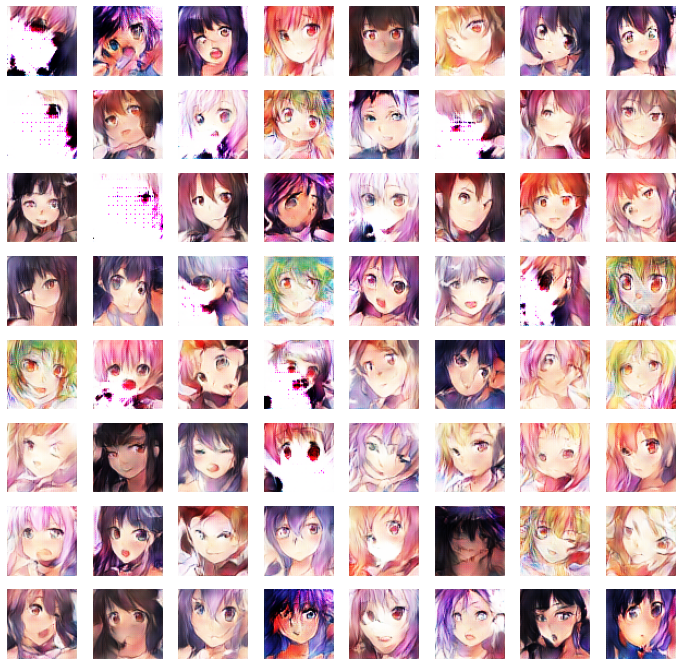

938/938 [==============================] - 1002s 1s/step - generator loss: 2.3170 - discriminator_loss: 0.7410
Epoch 2/100
938/938 [==============================] - ETA: 0s - generator loss: 2.1947 - discriminator_loss: 0.7750

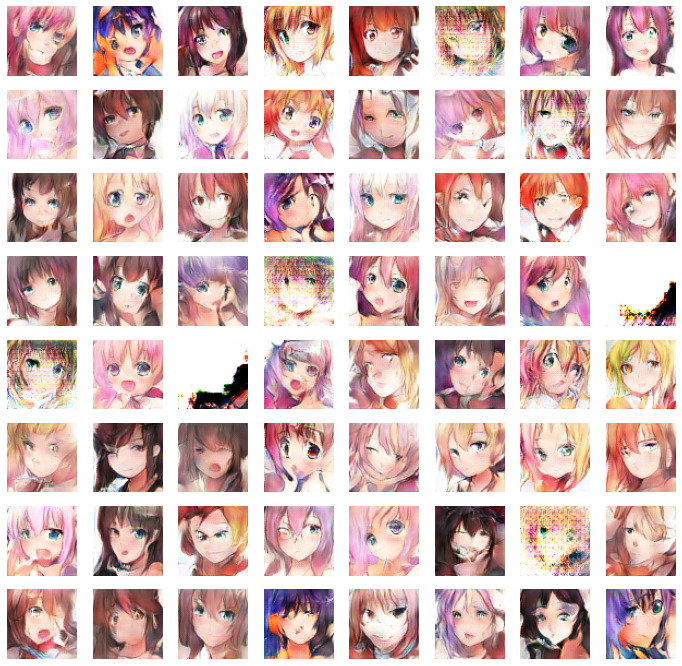

938/938 [==============================] - 956s 1s/step - generator loss: 2.1944 - discriminator_loss: 0.7750
Epoch 3/100
938/938 [==============================] - ETA: 0s - generator loss: 2.2494 - discriminator_loss: 2.7171

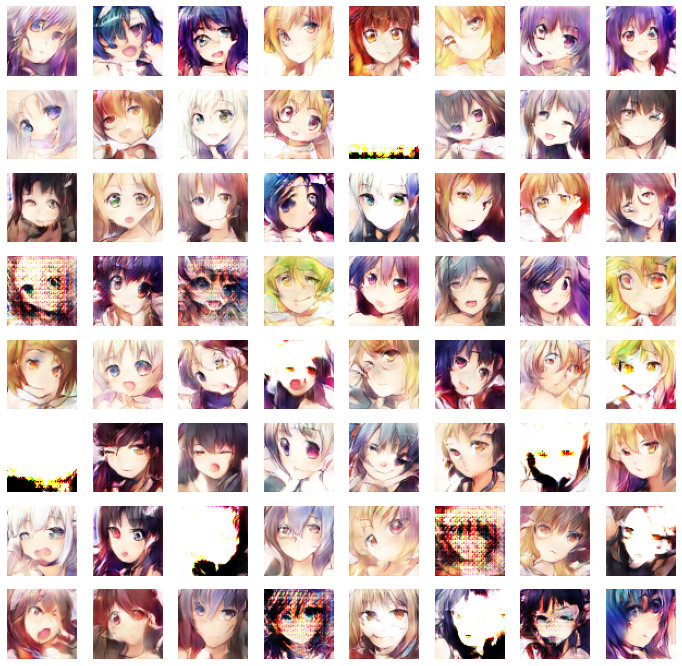

938/938 [==============================] - 952s 1s/step - generator loss: 2.2480 - discriminator_loss: 2.7157
Epoch 4/100
938/938 [==============================] - ETA: 0s - generator loss: 2.1919 - discriminator_loss: 0.7847

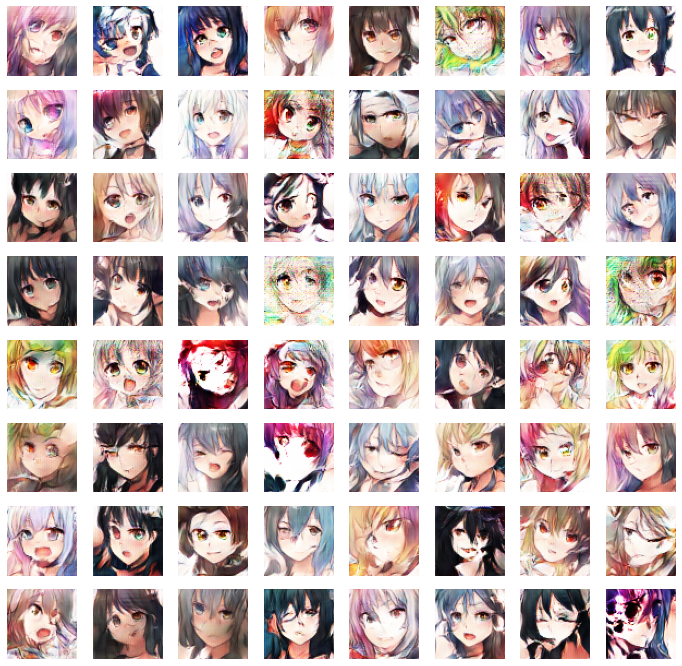

938/938 [==============================] - 954s 1s/step - generator loss: 2.1907 - discriminator_loss: 0.7854
Epoch 5/100
938/938 [==============================] - ETA: 0s - generator loss: 2.1206 - discriminator_loss: 0.7939

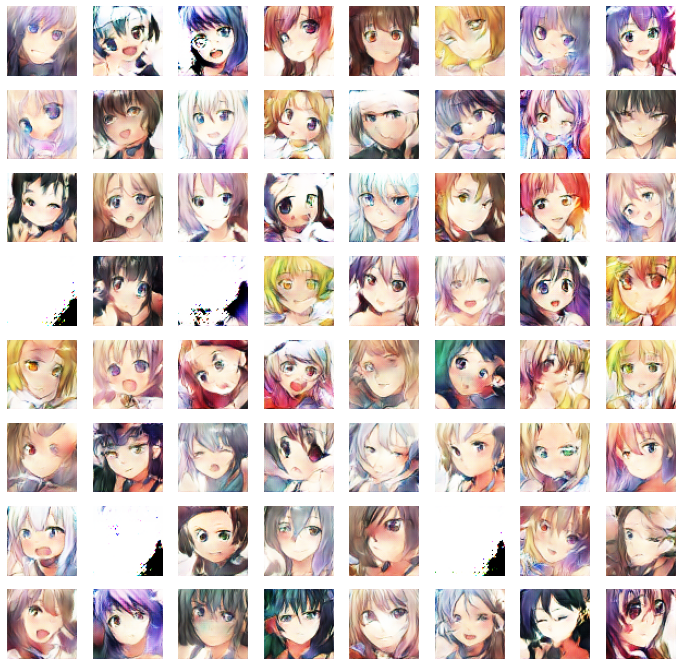

938/938 [==============================] - 951s 1s/step - generator loss: 2.1203 - discriminator_loss: 0.7938
Epoch 6/100
938/938 [==============================] - ETA: 0s - generator loss: 2.0822 - discriminator_loss: 0.8117

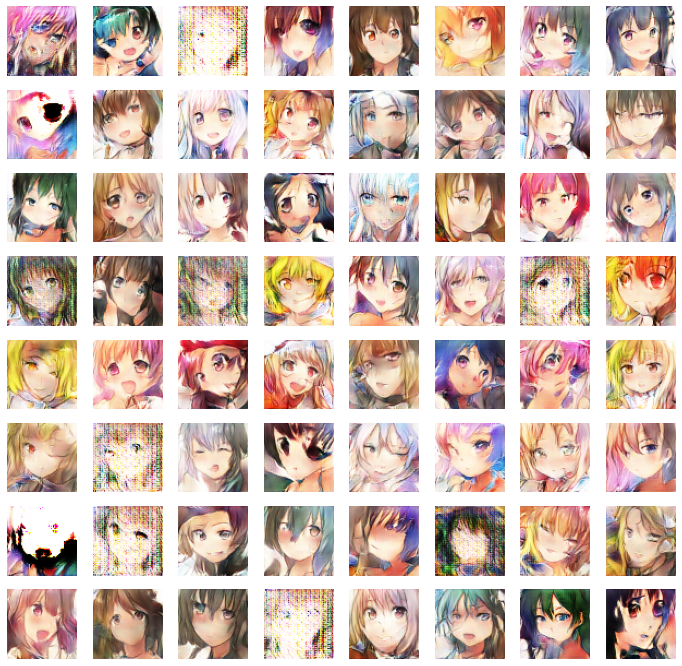

938/938 [==============================] - 954s 1s/step - generator loss: 2.0828 - discriminator_loss: 0.8116
Epoch 7/100
938/938 [==============================] - ETA: 0s - generator loss: 2.0793 - discriminator_loss: 0.8419

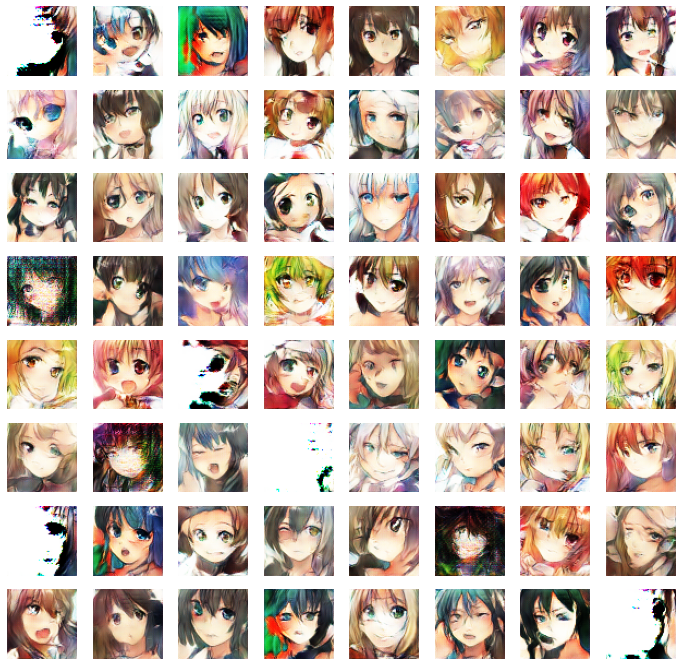

938/938 [==============================] - 956s 1s/step - generator loss: 2.0789 - discriminator_loss: 0.8421
Epoch 8/100
938/938 [==============================] - ETA: 0s - generator loss: 2.0228 - discriminator_loss: 0.8193

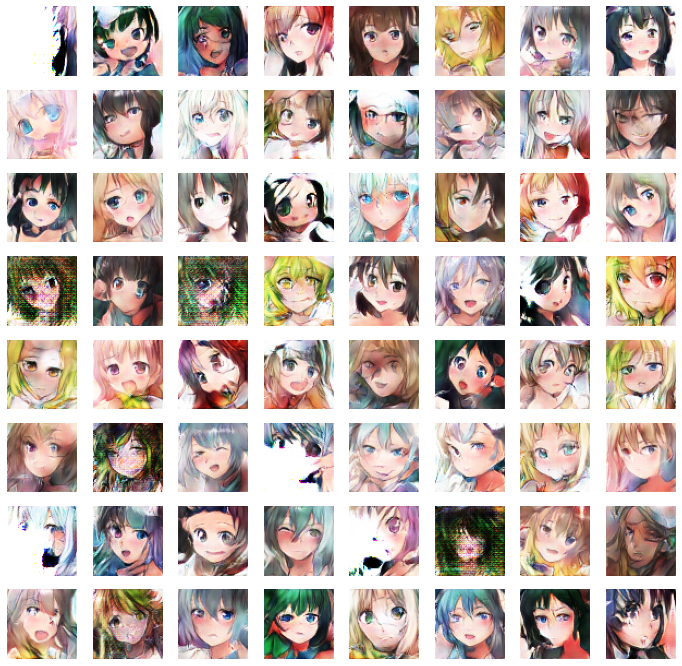

938/938 [==============================] - 954s 1s/step - generator loss: 2.0226 - discriminator_loss: 0.8192
Epoch 9/100
938/938 [==============================] - ETA: 0s - generator loss: 1.9832 - discriminator_loss: 0.8413

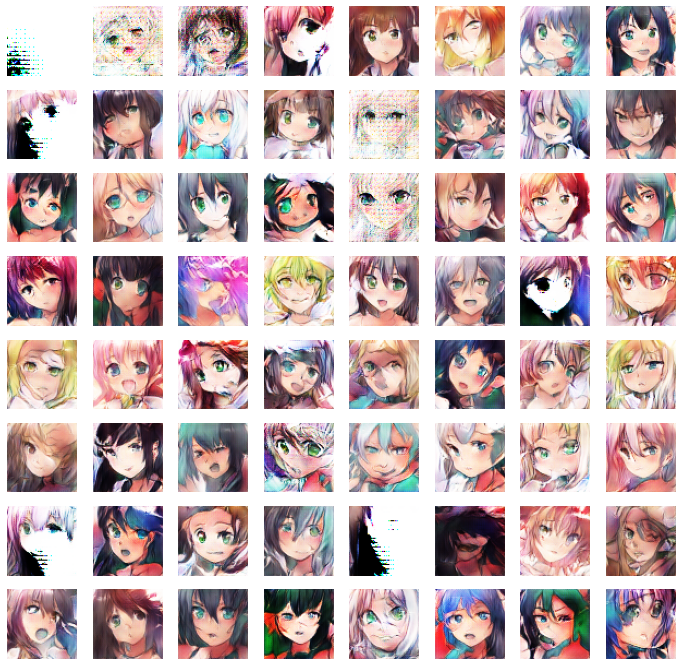

938/938 [==============================] - 953s 1s/step - generator loss: 1.9835 - discriminator_loss: 0.8413
Epoch 10/100
 60/938 [>.............................] - ETA: 14:56 - generator loss: 1.8203 - discriminator_loss: 1.2330

In [ ]:
gan.fit(dataset,epochs=100,batch_size=batch_size,callbacks=[save_images(fix_seed),checkpoint_callback()])